In [77]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [78]:
file = open("wf_0V_2.0g.csv")
time = []
waveform = []
vwaveform = []
qwaveform = []
freq = []
for line in file:
    try:
        temp = line.split(",")
        time[-1].append(float(temp[0]))
        waveform[-1].append(float(temp[1]))
        vwaveform[-1].append(float(temp[2]))
        qwaveform[-1].append(float(temp[3]))
    except:
        time.append([])
        waveform.append([])
        vwaveform.append([])
        qwaveform.append([])
        freq.append(float(line[2:]))

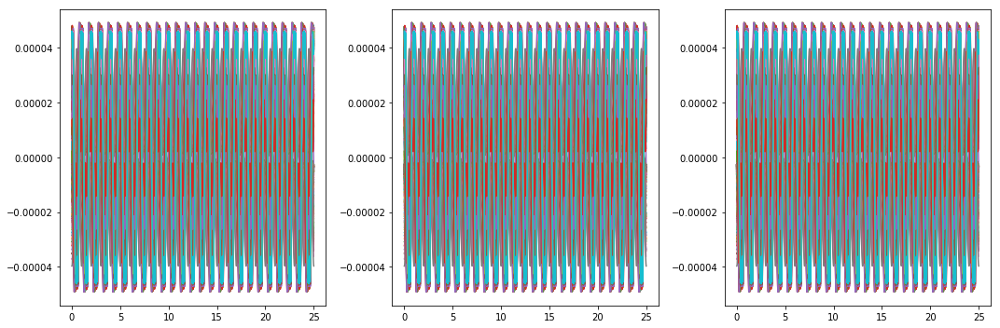

In [79]:
fig,axs = plt.subplots(ncols = 3,figsize=(15,5))
for i in range(len(time)):
    axs[0].plot(np.array(time[i])*freq[i],waveform[i])
    axs[1].plot(np.array(time[i])*freq[i],waveform[i])
    axs[2].plot(np.array(time[i])*freq[i],waveform[i])
plt.tight_layout()
plt.show()

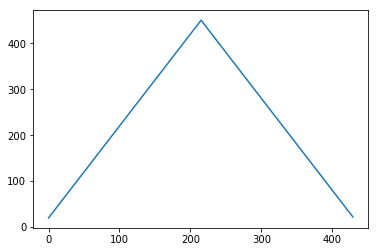

In [80]:
plt.plot(freq)
plt.show()

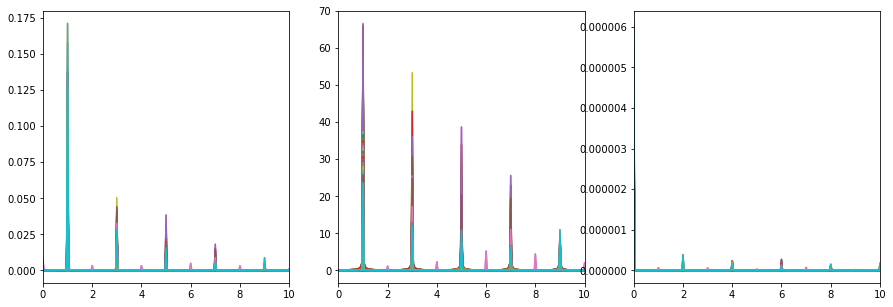

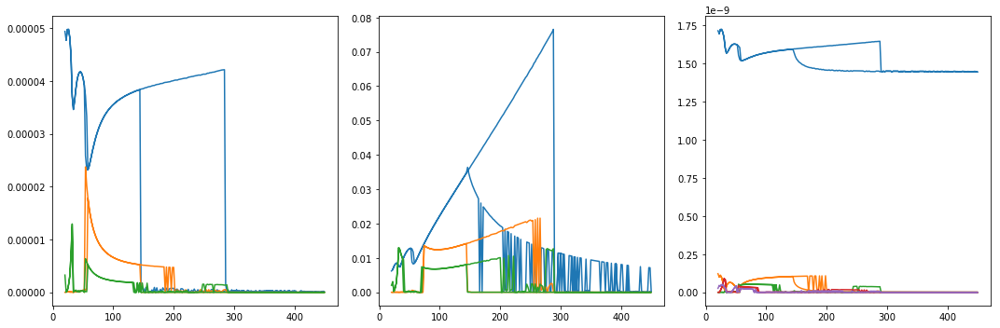

In [81]:
first_harm_x = []
third_harm_x = []
fiveth_harm_x = []
first_harm_v = []
third_harm_v = []
fiveth_harm_v = []
zero_harm_q = []
second_harm_q = []
fourth_harm_q = []
sixth_harm_q = []
eighth_harm_q = []
fig,axs = plt.subplots(ncols = 3,figsize=(15,5))
for i in range(len(time)):
    tt = np.arange(time[i][0],time[i][-1],(time[i][-1]-time[i][0])/len(time[i]))
    a = np.interp(tt,time[i],waveform[i])
    b = np.interp(tt,time[i],vwaveform[i])
    c = np.interp(tt,time[i],qwaveform[i])
    N = int(0.5*len(tt))
    fftfreq = np.fft.fftfreq(2*N,d=tt[1]-tt[0])
    fft = np.fft.fft(a)
    vfft = np.fft.fft(b)
    qfft = np.fft.fft(c)
    
    axs[0].plot(fftfreq[:N]/freq[i],np.abs(fft[:N]))
    axs[1].plot(fftfreq[:N]/freq[i],np.abs(vfft[:N]))
    axs[2].plot(fftfreq[:N]/freq[i],np.abs(qfft[:N]))
    axs[0].set_xlim((0,10))
    axs[1].set_xlim((0,10))
    axs[2].set_xlim((0,10))
    j=0;
    fftmax = 0
    vfftmax = 0
    qfftmax = 0
    while(j<len(fftfreq)):
        if((fftfreq[j]/freq[i]>0.4)&(fftfreq[j]/freq[i]<1.6)):
            if(fftmax<fft[j]):
                fftmax = np.abs(fft[j])
            if(vfftmax<vfft[j]):
                vfftmax = np.abs(vfft[j])
        if((fftfreq[j]/freq[i]<0.4)):
            if(qfftmax<qfft[j]):
                qfftmax = np.abs(qfft[j])
        j+=1
    first_harm_x.append(fftmax/N)
    first_harm_v.append(vfftmax/N)
    zero_harm_q.append(qfftmax/N)
    j=0;
    fftmax = 0
    vfftmax = 0
    qfftmax = 0
    while(j<len(fftfreq)):
        if((fftfreq[j]/freq[i]>2.4)&(fftfreq[j]/freq[i]<3.6)):
            if(fftmax<fft[j]):
                fftmax = np.abs(fft[j])
            if(vfftmax<vfft[j]):
                vfftmax = np.abs(vfft[j])
        if((fftfreq[j]/freq[i]>1.4)&(fftfreq[j]/freq[i]<2.6)):
            if(qfftmax<qfft[j]):
                qfftmax = np.abs(qfft[j])
        j+=1
    third_harm_x.append(fftmax/N)
    third_harm_v.append(vfftmax/N)
    second_harm_q.append(qfftmax/N)
    j=0
    fftmax = 0
    vfftmax = 0
    qfftmax = 0
    while(j<len(fftfreq)):
        if((fftfreq[j]/freq[i]>4.4)&(fftfreq[j]/freq[i]<5.6)):
            if(fftmax<fft[j]):
                fftmax = np.abs(fft[j])
            if(vfftmax<vfft[j]):
                vfftmax = np.abs(vfft[j])
        if((fftfreq[j]/freq[i]>3.4)&(fftfreq[j]/freq[i]<4.6)):
            if(qfftmax<qfft[j]):
                qfftmax = np.abs(qfft[j])
        j+=1
    fiveth_harm_x.append(fftmax/N)
    fiveth_harm_v.append(vfftmax/N)
    fourth_harm_q.append(qfftmax/N)
    j=0
    qfftmax = 0
    while(j<len(fftfreq)):
        if((fftfreq[j]/freq[i]>5.4)&(fftfreq[j]/freq[i]<6.6)):
            if(qfftmax<qfft[j]):
                qfftmax = np.abs(qfft[j])
        j+=1
    sixth_harm_q.append(qfftmax/N)
    j=0
    qfftmax = 0
    while(j<len(fftfreq)):
        if((fftfreq[j]/freq[i]>7.4)&(fftfreq[j]/freq[i]<8.6)):
            if(qfftmax<qfft[j]):
                qfftmax = np.abs(qfft[j])
        j+=1
    eighth_harm_q.append(qfftmax/N)
plt.show()
fig,axs = plt.subplots(ncols = 3,figsize=(15,5))
axs[0].plot(freq,first_harm_x)
axs[1].plot(freq,first_harm_v)
axs[2].plot(freq,zero_harm_q)
axs[0].plot(freq,third_harm_x)
axs[1].plot(freq,third_harm_v)
axs[2].plot(freq,second_harm_q)
axs[0].plot(freq,fiveth_harm_x)
axs[1].plot(freq,fiveth_harm_v)
axs[2].plot(freq,fourth_harm_q)
axs[2].plot(freq,sixth_harm_q)
axs[2].plot(freq,eighth_harm_q)
plt.tight_layout()
plt.show()

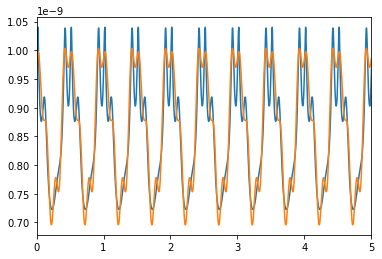

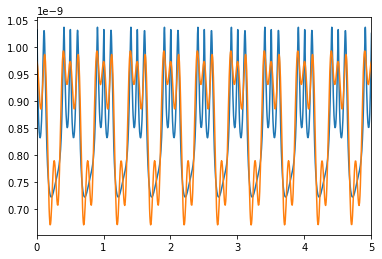

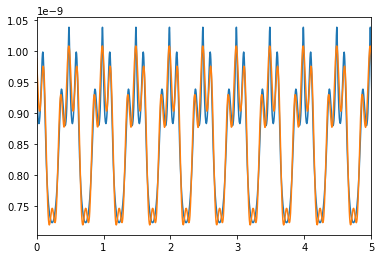

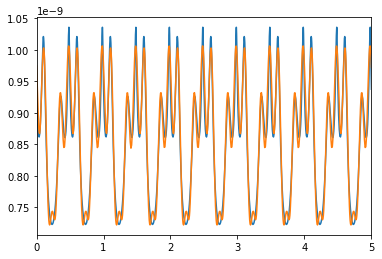

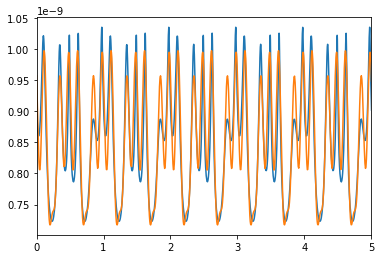

...

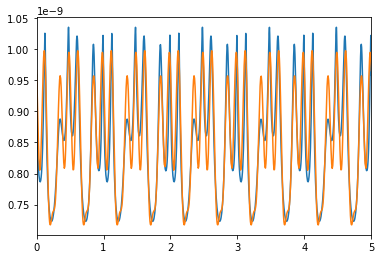

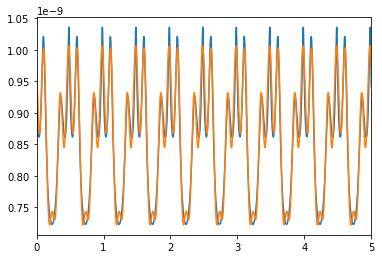

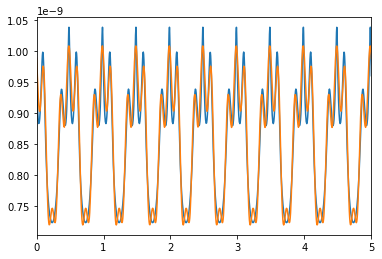

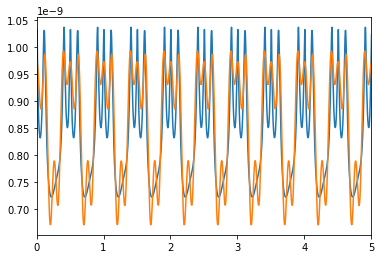

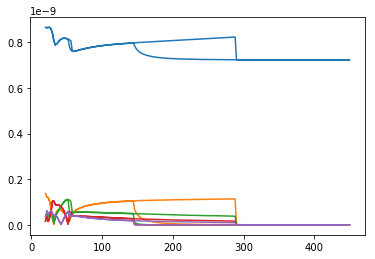

In [82]:
from scipy.optimize import curve_fit

def func(t,A0,A1,B1,A2,B2,A3,B3,A4,B4):
    return( A0 + A1*np.cos(4*np.pi*t + B1) + A2*np.cos(8*np.pi*t + B2) + A3*np.cos(12*np.pi*t + B3) + A4*np.cos(16*np.pi*t+B4))

A0 = []
A1 = []
A2 = []
A3 = []
A4 = []
init_popt = [0,0,0,0,0,0,0,0,0]
for i in range(len(time)):
    plt.plot(np.array(time[i])*freq[i],qwaveform[i])
    popt, pcov = curve_fit(func,np.array(time[i])*freq[i], np.array(qwaveform[i]), method="dogbox",p0=init_popt,sigma = 1e-8*np.ones(len(qwaveform[i])))
    init_popt = popt
    A0.append(popt[0])
    A1.append(popt[1])
    A2.append(popt[3])
    A3.append(popt[5])
    A4.append(popt[7])
    plt.plot(np.array(time[i])*freq[i],func(np.array(time[i])*freq[i],*popt))
    plt.xlim((0,5))
    plt.show()

plt.plot(freq,np.abs(A0))
plt.plot(freq,np.abs(A1))
plt.plot(freq,np.abs(A2))
plt.plot(freq,np.abs(A3))
plt.plot(freq,np.abs(A4))
plt.show()

In [83]:
Cpar = 20e-12
dcap = 54.2e-6
C0 = 3.2e-12
V0 = 21.0
Rl = 6.65e6
def Cap(x):
    return(Cpar + 2.0*dcap**2*C0/(dcap**2 - x**2))
epc_total = []
epc_first = []
epc_third = []
epc_fivth = []
epc_seventh = []

for i in range(len(time)):
    epc_tot = 0.0
    epc_fir = 0.0
    epc_thi = 0.0
    epc_fiv = 0.0
    epc_sev = 0.0
    for j in range(len(time[i])-1):
        epc_tot += ((qwaveform[i][j+1] - qwaveform[i][j])/(time[i][j+1] - time[i][j]))**2*Rl*(time[i][j+1] - time[i][j])
        epc_fir += (-4*np.pi*freq[i]*A1[i]*np.sin(4*np.pi*freq[i]*time[i][j]))**2*Rl*(time[i][j+1] - time[i][j])
        epc_thi += (-8*np.pi*freq[i]*A2[i]*np.sin(8*np.pi*freq[i]*time[i][j]))**2*Rl*(time[i][j+1] - time[i][j])
        epc_fiv += (-12*np.pi*freq[i]*A3[i]*np.sin(12*np.pi*freq[i]*time[i][j]))**2*Rl*(time[i][j+1] - time[i][j])
        epc_sev += (-16*np.pi*freq[i]*A4[i]*np.sin(16*np.pi*freq[i]*time[i][j]))**2*Rl*(time[i][j+1] - time[i][j])
    epc_total.append(1e9*epc_tot/((time[i][-1]-time[i][0])*freq[i]))
    epc_first.append(1e9*epc_fir/((time[i][-1]-time[i][0])*freq[i]))
    epc_third.append(1e9*epc_thi/((time[i][-1]-time[i][0])*freq[i]))
    epc_fivth.append(1e9*epc_fiv/((time[i][-1]-time[i][0])*freq[i]))
    epc_seventh.append(1e9*epc_sev/((time[i][-1]-time[i][0])*freq[i]))

In [97]:
file = open("export_0V_0.5g.csv")
epc_lin = []
freq_lin = []
for line in file:
    temp = line.split(",")
    freq_lin.append(float(temp[0]))
    epc_lin.append(float(temp[1]))

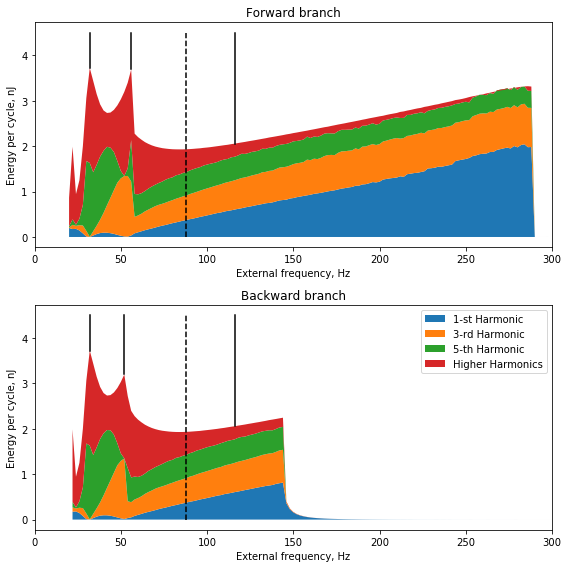

In [159]:
from mpl_toolkits.axes_grid.inset_locator import (inset_axes, InsetPosition, mark_inset)

fig,axs = plt.subplots(nrows=2,figsize=(8,8))
N = len(freq)//2
axs[0].fill_between(freq[:N],epc_first[:N],np.zeros(N))
axs[0].fill_between(freq[:N],np.array(epc_first[:N])+np.array(epc_third[:N]),np.array(epc_first[:N]))
axs[0].fill_between(freq[:N],np.array(epc_first[:N])+np.array(epc_third[:N])+np.array(epc_fivth[:N]),np.array(epc_first[:N])+np.array(epc_third[:N]))
axs[0].fill_between(freq[:N],epc_total[:N],np.array(epc_first[:N])+np.array(epc_third[:N])+np.array(epc_fivth[:N]))
axs[1].fill_between(freq[N:],epc_first[N:],np.zeros(N),label="1-st Harmonic")
axs[1].fill_between(freq[N:],np.array(epc_first[N:])+np.array(epc_third[N:]),np.array(epc_first[N:]),label="3-rd Harmonic")
axs[1].fill_between(freq[N:],np.array(epc_first[N:])+np.array(epc_third[N:])+np.array(epc_fivth[N:]),np.array(epc_first[N:])+np.array(epc_third[N:]),label="5-th Harmonic")
axs[1].fill_between(freq[N:],epc_total[N:],np.array(epc_first[N:])+np.array(epc_third[N:])+np.array(epc_fivth[N:]),label="Higher Harmonics")
ymax = 4.5
axs[0].plot([87.9,87.9],[0,ymax],'--', color = "k")
axs[1].plot([87.9,87.9],[0,ymax],'--', color = "k")
j = 6
axs[0].plot([freq[j],freq[j]],[epc_total[j],ymax], color = "k")
j = 18
axs[0].plot([freq[j],freq[j]],[epc_total[j],ymax], color = "k")
j = 48
axs[0].plot([freq[j],freq[j]],[epc_total[j],ymax], color = "k")
j = 424
axs[1].plot([freq[j],freq[j]],[epc_total[j],ymax], color = "k")
j = 414
axs[1].plot([freq[j],freq[j]],[epc_total[j],ymax], color = "k")
j = 382
axs[1].plot([freq[j],freq[j]],[epc_total[j],ymax], color = "k")
axs[0].set_xlim((0,300))
axs[1].set_xlim((0,300))
axs[0].set_title("Forward branch")
axs[1].set_title("Backward branch")
axs[0].set_xlabel("External frequency, Hz")
axs[1].set_xlabel("External frequency, Hz")
axs[0].set_ylabel("Energy per cycle, nJ")
axs[1].set_ylabel("Energy per cycle, nJ")
axs[1].legend()
plt.tight_layout()
plt.savefig("complare_energy.svg")
plt.show()

32.0


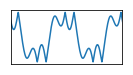

In [151]:
axs, fig = plt.subplots(figsize=(2,1))
i = 6
print(freq[i])
plt.xticks([])
plt.yticks([])
plt.plot(np.array(time[i])*freq[i],waveform[i])
plt.xlim([0,2])
plt.savefig("waveform_1.svg")

430 32.0


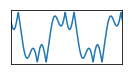

In [152]:
axs, fig = plt.subplots(figsize=(2,1))
i = 424
print(len(freq),freq[i])
plt.xticks([])
plt.yticks([])
plt.plot(np.array(time[i])*freq[i],waveform[i])
plt.xlim([0,2])
plt.savefig("waveform_2.svg")

56.0


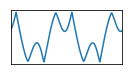

In [153]:
axs, fig = plt.subplots(figsize=(2,1))
i = 18
print(freq[i])
plt.xticks([])
plt.yticks([])
plt.plot(np.array(time[i])*freq[i],waveform[i])
plt.xlim([0,2])
plt.savefig("waveform_3.svg")

52.0


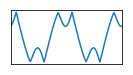

In [154]:
axs, fig = plt.subplots(figsize=(2,1))
i = 414
print(freq[i])
plt.xticks([])
plt.yticks([])
plt.plot(np.array(time[i])*freq[i],waveform[i])
plt.xlim([0,2])
plt.savefig("waveform_4.svg")

116.0


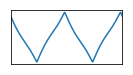

In [155]:
axs, fig = plt.subplots(figsize=(2,1))
i = 48
print(freq[i])
plt.xticks([])
plt.yticks([])
plt.plot(np.array(time[i])*freq[i],waveform[i])
plt.xlim([0,2])
plt.savefig("waveform_5.svg")

116.0


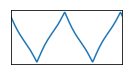

In [160]:
axs, fig = plt.subplots(figsize=(2,1))
i = 382
print(freq[i])
plt.xticks([])
plt.yticks([])
plt.plot(np.array(time[i])*freq[i],waveform[i])
plt.xlim([0,2])
plt.savefig("waveform_6.svg")